# Predicting Rock Lithology using Machine Learning

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#preprocessing">Data Preprocessing</a></li>
<li><a href="#mdd">Model Development</a></li>
<li><a href="#mde">Model Evaluation</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction
The identification of a rock's lithology is fundamental to all reservoir characterization because the physical and chemical properties of the rock that holds hydrocarbons and/or water affect the response of every tool used to measure formation properties. Understanding reservoir lithology is the foundation from which all other petrophysical calculations are made. To make accurate petrophysical calculations of porosity, water saturation (Sw), and permeability, the various lithologies of the reservoir interval must be identified and their implications understood. Lithology means "the composition or type of rock such as sandstone or limestone."

The litholgies in our dataset include
   - Anhydrite
   - Basement
   - Chalk
   - Coal
   - Dolomite
   - Halite
   - Limestone
   - Marl
   - Sandstone
   - Sandstone/Shale
   - Shale
   - Tuff


### Challenges

Obtaining a physical sample of the reservoir is the surest way to unambiguously determine lithology and rock type, but obtaining this physical sample is not always easy. Mud logs are the first choice in wildcat wells, but exact assignment of a rock fragment to a particular depth is not without error. The size of the individual rock sample examined at the surface is rather small because it is limited by the size of drill cuttings and rock strength. Weak rocks, ones without cement, are often reduced to original detrital grain size by the drilling process, making it difficult to determine rock type, but still possible to determine lithology. 

If no direct rock sample is available in a given zone, log responses must be used alone to simultaneously determine lithology


With the recent developments, computing power, and availability of large data, the use of machine learning approach has spurred the interest of the oil and gas industry. Other works has been done to predict lithology using machine learning. This approach uses artificial neural networks and random forest to classify lithology using well logs, location of the well and its depth. 


### Understanding the dataset

The data contains the metadata columns
* WELL: well name
* DEPTH_MD: measured depth
* X_LOC: UTM X coordinate 
* Y_LOC: UTM Y coordinate
* Z_LOC: DEPTH
* GROUP: NPD lithostratigraphy group
* FORMATION: NPD lithostratgraphy formation

The data contains the well log curves. For example the following:
* BS: Bit Size
* CALI: Caliper
* RDEP: Deep Resistivity
* RHOB: Bulk Density
* GR: Raw gamma data
* SGR: Spectral Gamma Ray
* RMED: Medium Resistivity
* ROP: Rate of Penetration
* NPHI: Neutron Porosity
* PEF: Photoelectric Absorption Factor
* RSHA: Shallow Resistivity
* DTS: Sonic (Sheer Slowness)
* DTC: Sonic (Compressional Slowness)

as well as the interpretation

* FORCE_2020_LITHOFACIES_LITHOLOGY: lithology class label
* FORCE_2020_LITHOFACIES_CONFIDENCE: confidence in lithology interpretation (1: high, 2: medium, 3: low)

<a id='wrangling'></a>
## Data Wrangling

### Installing the required libraries

In [1]:
#pip install imblearn --user #For Handling for undersampled classes using Over sampling method

### Installing the required libraries

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn import preprocessing
import pandas_profiling

### Loading the data

In [3]:
df = pd.read_csv("train.csv", delimiter = ';')

In [4]:
df.head(2)

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.61141,...,34.63641,NaN,NaN,-0.574928,NaN,NaN,NaN,NaN,65000,1.0
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.61807,...,34.63641,NaN,NaN,-0.570188,NaN,NaN,NaN,NaN,65000,1.0


### Data summary and Profile

In [523]:
from skimpy import skim

skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                 Data Types                                                                │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                         │
│ ┃ dataframe         ┃ Values  ┃ ┃ Column Type ┃ Count ┃                                                         │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                         │
│ │ Number of rows    │ 1170511 │ │ float64     │ 25    │                                                         │
│ │ Number of columns │ 29      │ │ string      │ 3     │                                                         │
│ └───────────────────┴─────────┘ │ int32       │ 1     │                                                         │
│                                 └─────────────┴───────┘                                                         │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name          ┃ NA      ┃ NA %  ┃ mean    ┃ sd     ┃ p0      ┃ p25     ┃ p75     ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ DEPTH_MD             │       0 │     0 │    2200 │   1000 │     140 │    1400 │    2900 │    5400 │ ▃█▇▅▂  │  │
│ │ X_LOC                │   11000 │  0.92 │  490000 │  35000 │  430000 │  450000 │  520000 │  570000 │ ▇██▄▇▁ │  │
│ │ Y_LOC                │   11000 │  0.92 │ 6700000 │ 130000 │ 6400000 │ 6600000 │ 6800000 │ 6900000 │ ▄▁▅▁██ │  │
│ │ Z_LOC                │   11000 │  0.92 │   -2100 │    970 │   -5400 │   -2800 │   -1400 │    -110 │  ▂▅▇█▃ │  │
│ │ CALI                 │   88000 │   7.5 │      13 │    3.8 │     2.3 │     9.4 │      17 │      28 │  ▅█▅▁  │  │
│ │ RSHA                 │  540000 │    46 │      11 │    100 │  0.0001 │    0.85 │     3.1 │    2200 │   █    │  │
│ │ RMED                 │   39000 │   3.3 │       5 │     55 │ -0.0084 │    0.91 │     2.7 │    2000 │   █    │  │
│ │ RDEP                 │   11000 │  0.94 │      11 │    110 │   0.032 │    0.91 │     2.6 │    2000 │   █    │  │
│ │ RHOB                 │  160000 │    14 │     2.3 │   0.25 │    0.72 │     2.1 │     2.5 │     3.5 │   ▃█▂  │  │
│ │ GR                   │       0 │     0 │      71 │     34 │    0.11 │      48 │      89 │    1100 │   █    │  │
│ │ SGR                  │ 1100000 │    94 │      65 │     38 │    -780 │      43 │      88 │     960 │    █▂  │  │
│ │ NPHI                 │  410000 │    35 │    0.33 │   0.13 │  -0.036 │    0.24 │    0.42 │       1 │  ▁▇█▂  │  │
│ │ PEF                  │  500000 │    43 │     6.3 │     11 │     0.1 │     3.4 │       6 │     380 │   █    │  │
│ │ DTC                  │   81000 │   6.9 │     110 │     30 │     7.4 │      88 │     140 │     320 │   █▇   │  │
│ │ SP                   │  310000 │    26 │      60 │     77 │   -1000 │      32 │      83 │     530 │    ▁█  │  │
│ │ BS                   │  490000 │    42 │      12 │    3.3 │       6 │     8.5 │      12 │      26 │  ▆█ ▃  │  │
│ │ ROP                  │  640000 │    54 │     140 │   1500 │   -0.12 │     5.6 │      35 │   47000 │   █    │  │
│ │ DTS                  │ 1000000 │    85 │     200 │     71 │      69 │     160 │     220 │     680 │  ▆█▂▁  │  │
│ │ DCAL                 │  870000 │    74 │     1.2 │     54 │     -12 │    0.15 │     1.3 │   10000 │   █    │  │
│ │ DRHO                 │  180000 │    16 │   0.012 │    7.5 │   -7400 │ -0.0093 │   0.022 │     2.8 │      █ │  │
│ │ MUDWEIGHT            │  850000 │    73 │     1.2 │     10 │    0.13 │    0.14 │     1.2 │     190 │   █    │  │
│ │ RMIC                 │  990000 │    85 │     7.8 │  

### Check for missing values

In [ ]:
# WHAT PERCENTAGE OF EACH ATTRIBUTE IS MISSING
missing_values = df.isna().mean()*100
missing_values = pd.DataFrame(missing_values)
missing_values.columns = ["Percentage_of_missing_values"]
columns_high_nulls = list(missing_values.query("Percentage_of_missing_values > 50").index)

> Selecting columns with over 50% of missing values, the values cannot be sourced, and using the conventional methods of filling these nulls would create a bias, and would have an adverse effect on our model

In [10]:
# making a copy of the dataframe
data = df.copy()

In [11]:
# Dropping columns with missing values for the depth and location of the well
data.dropna(subset = ["X_LOC"], inplace = True)

In [12]:
# Dropping Columns with missing values greater than 50%
data.drop(columns_high_nulls, axis = "columns", inplace = True)

In [13]:
# Making a copy of the new dataframe
data2 = data.copy()

In [14]:
# Saving names of the columns to Attribues
Attributes = data2.columns.to_list()

In [15]:
# Selecting the columns of numeric data type
Numeric_variables = Attributes[7:-2]

In [16]:
lithology_keys = {30000: 'Sandstone',
                 65030: 'Sandstone/Shale',
                 65000: 'Shale',
                 80000: 'Marl',
                 74000: 'Dolomite',
                 70000: 'Limestone',
                 70032: 'Chalk',
                 88000: 'Halite',
                 86000: 'Anhydrite',
                 99000: 'Tuff',
                 90000: 'Coal',
                 93000: 'Basement'}

In [17]:
data.dropna(subset = ["X_LOC"], inplace = True)
data.drop(columns_high_nulls, axis = "columns", inplace = True)
data2 = data.copy()
data2["Lithology"] = data2.FORCE_2020_LITHOFACIES_LITHOLOGY.map(lithology_keys)

> Creating a column that contains the lithology of each well at a particular depth and location using its "FORCE_2020_LITHOFACIES_LITHOLOGY"


In [105]:
# Defining a function that plots the Kde and box plot of a variable
labels = ['Sandstone','Sandstone/Shale','Shale','Marl','Dolomite','Limestone','Chalk','Halite','Anhydrite','Tuff','Coal','Basement']
def distribution_plots(df,variable, hue = None):
    if hue != None:
        fig, ax = plt.subplots(2,2, figsize=(15,8))
        sns.kdeplot(data=df, x=variable, ax = ax[0,0])
        sns.kdeplot(data=df, x=variable, ax = ax[0,1], hue= hue)
        sns.boxplot(data=df, y=variable, ax = ax[1,0])
        sns.boxplot(data=df,x = hue, y=variable, ax = ax[1,1])
        ax[1,1].set_xticklabels(labels = labels, rotation=90)
        plt.show()
        plt.clf()
    else:
        fig, ax = plt.subplots(1,2, figsize=(15,4))
        sns.kdeplot(data=df, x=variable, ax = ax[0])
        sns.boxplot(data=df, y=variable, ax = ax[1], hue =hue)
        plt.show()
        plt.clf()
        

### Checking for outliers

In [65]:
# Defining a function for calculating the upper limit for outliers
def outlier_upper_limit(asdf):
    q = list(asdf.quantile([0.25,0.75]))
    z = q[1] + 1.5 * (q[1]-q[0])
    return z

def outlier_lower_limit(asdf):
    q = list(asdf.quantile([0.25,0.75]))
    z = q[0] - 1.5 * (q[1]-q[0])
    return z

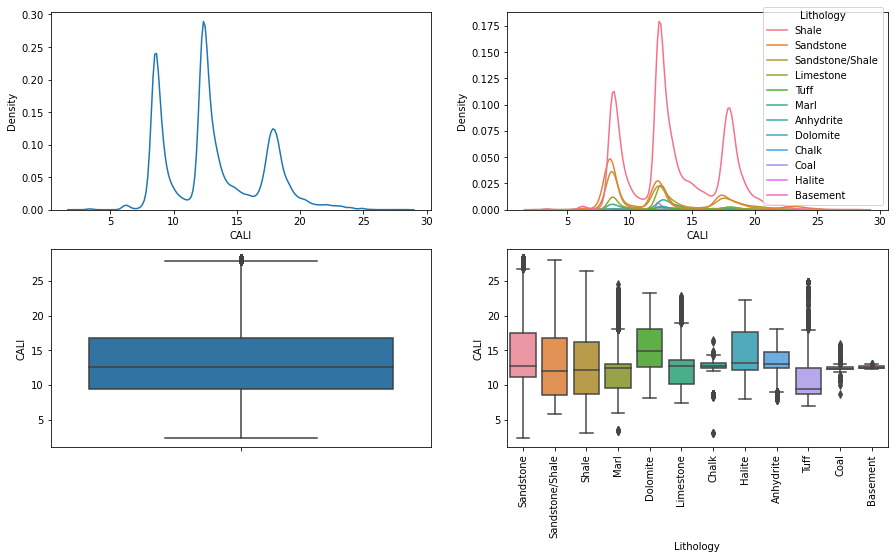

<Figure size 432x288 with 0 Axes>

In [106]:
distribution_plots(data2, Numeric_variables[0], "Lithology")

The distribution of CALI is multimodal and right skewed. The boxplot for CALI shows that there outliers for CALI at the upper end of its distribution. The boxplots of CALI for each class shows that the different classes have different distributions for CALI and some classes like Marl, Chalk, and Coal have outliers on both ends of the their the distributions. Some Classes like Sandstone/Shale, shale, dolomite and Halite do not have outliers for CALI. 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


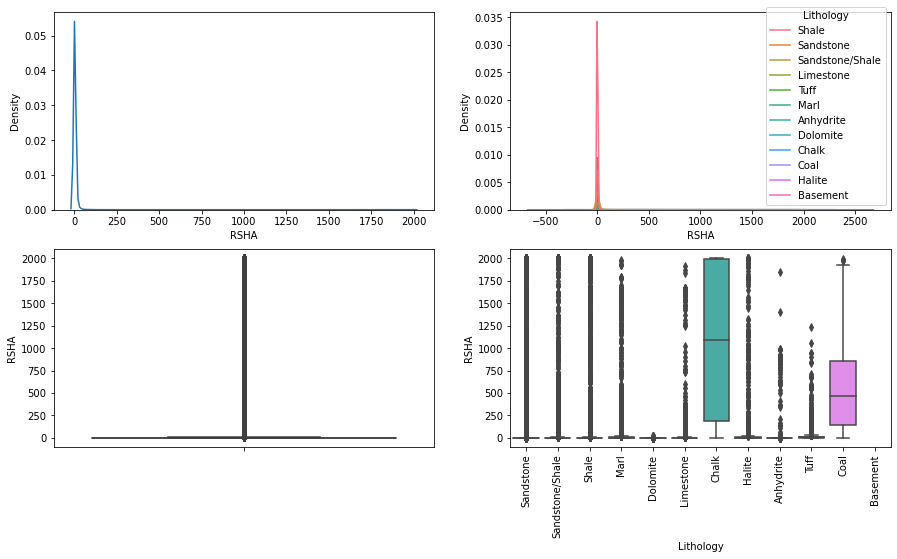

<Figure size 432x288 with 0 Axes>

In [107]:
distribution_plots(data2, Numeric_variables[1], "Lithology")

The data is right skewed with majority of its values detected as outliers. Only the RSHA of two classes (Anhydrite and Halite) do not have its observations or values as outliers. The large variablity of RSHA makes RSHA a bad variable for predicting classes. 

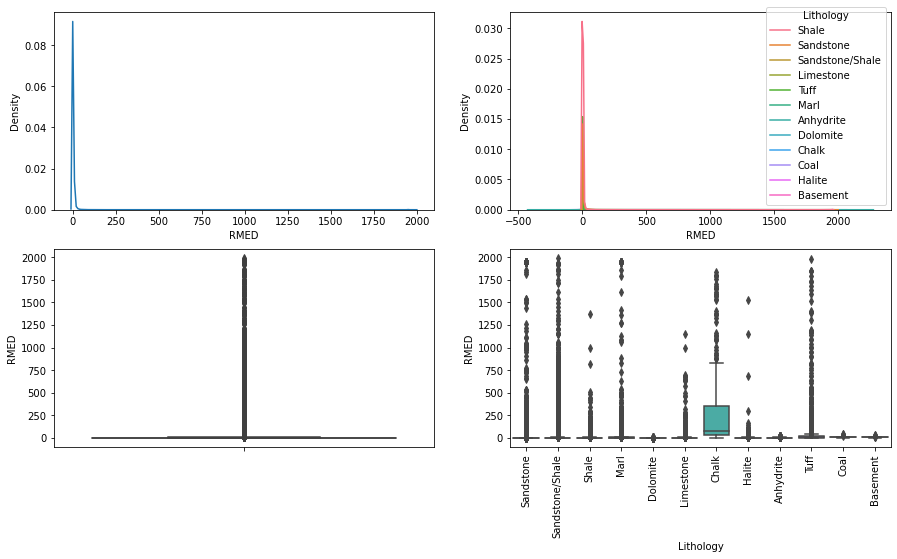

<Figure size 432x288 with 0 Axes>

In [109]:
distribution_plots(data2, Numeric_variables[2], "Lithology")

The data is right skewed with majority of its values detected as outliers. Only the RMED of one classes (Anhydrite) do not have most of its observations or values as outliers. The large variablity of RMED makes RMED a bad variable for predicting classes.

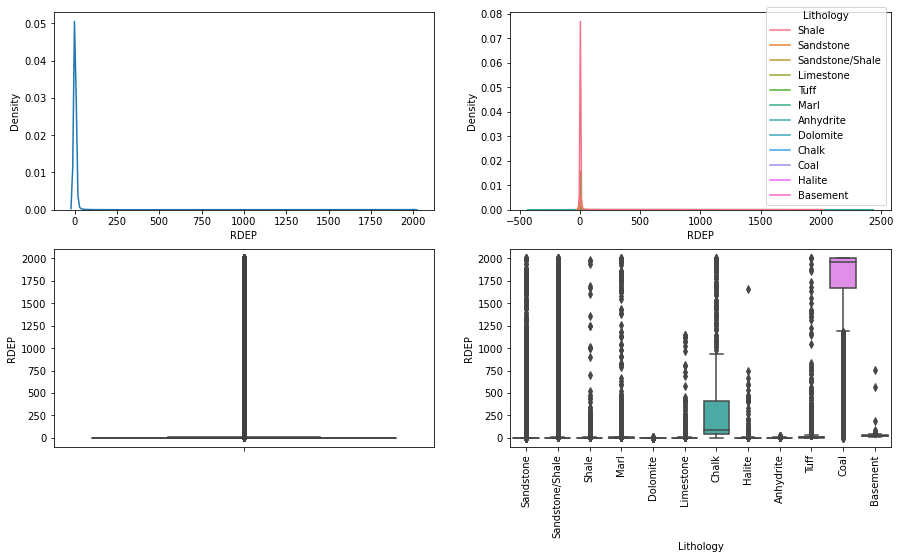

<Figure size 432x288 with 0 Axes>

In [110]:
distribution_plots(data2, Numeric_variables[3], "Lithology")

The data is right skewed with majority of its values detected as outliers. Only the RDEP of two classes (Anhydrite, Halite) do not have most of its observations or values as outliers. The large variablity of RDEP makes RDEP a bad variable for predicting classes.

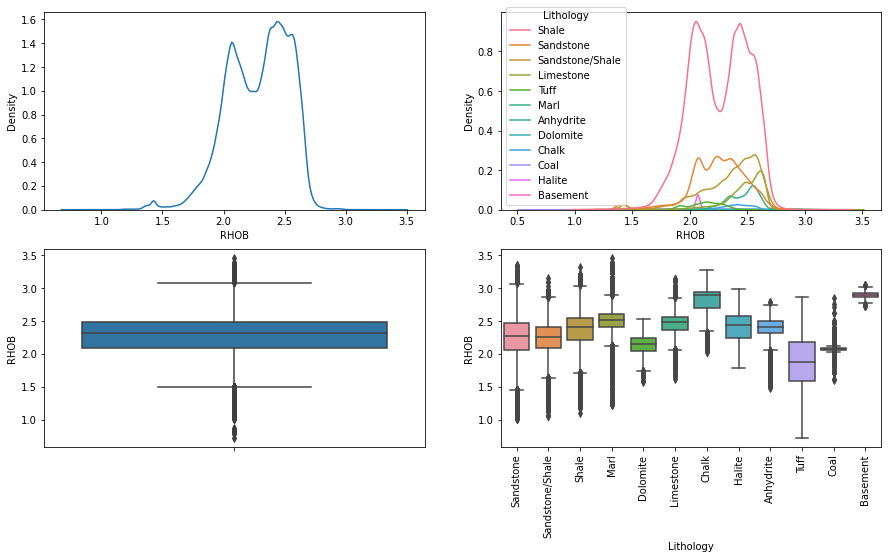

<Figure size 432x288 with 0 Axes>

In [111]:
distribution_plots(data2, Numeric_variables[4], "Lithology")

The distribution of RHOB for the different classes are different. The RHOB has outlies on both ends of its distribution, this is also true for the distribution of RHOB for each of the classes. Chalks and Basement have higher values than the rest of the classes. 

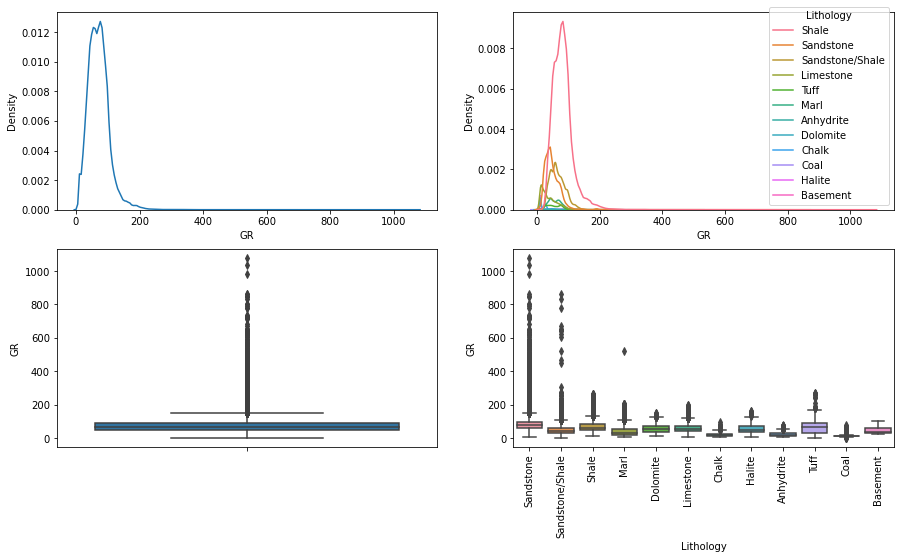

<Figure size 432x288 with 0 Axes>

In [115]:
distribution_plots(data2, Numeric_variables[5], "Lithology")

The distribution of GR is right skewed with the its outliers on the heavier side of its distribution. The different classes have different distribution of GR which is being distorted by outliers. 

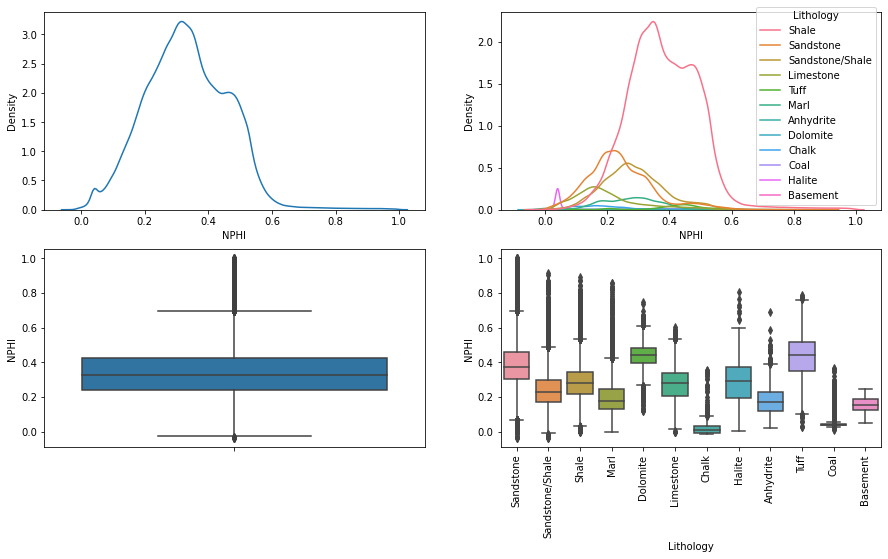

<Figure size 432x288 with 0 Axes>

In [113]:
distribution_plots(data2, Numeric_variables[6], "Lithology")

NPHI has outliers on both sides of its distribution. Sandstone, tuff and dolomite have higher values for NPHI.Chalk and Coal ahve lower values of NPHI 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


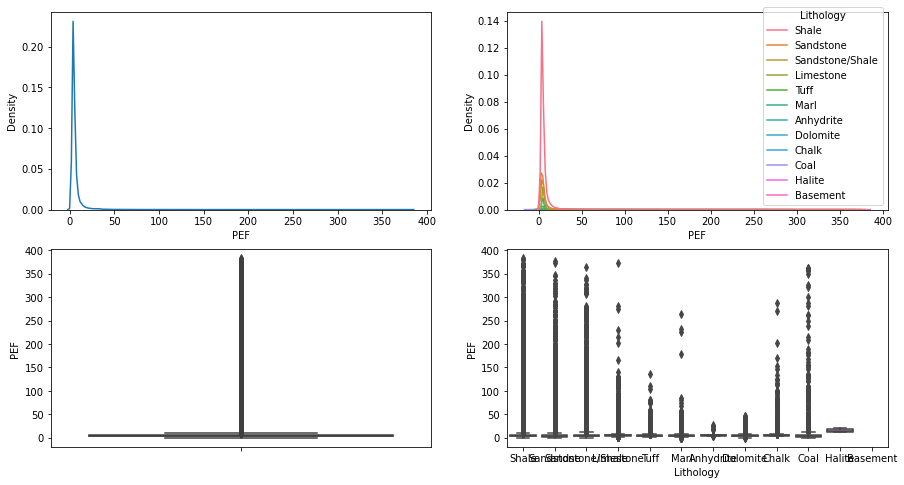

<Figure size 432x288 with 0 Axes>

In [102]:
distribution_plots(data2, Numeric_variables[7], "Lithology")

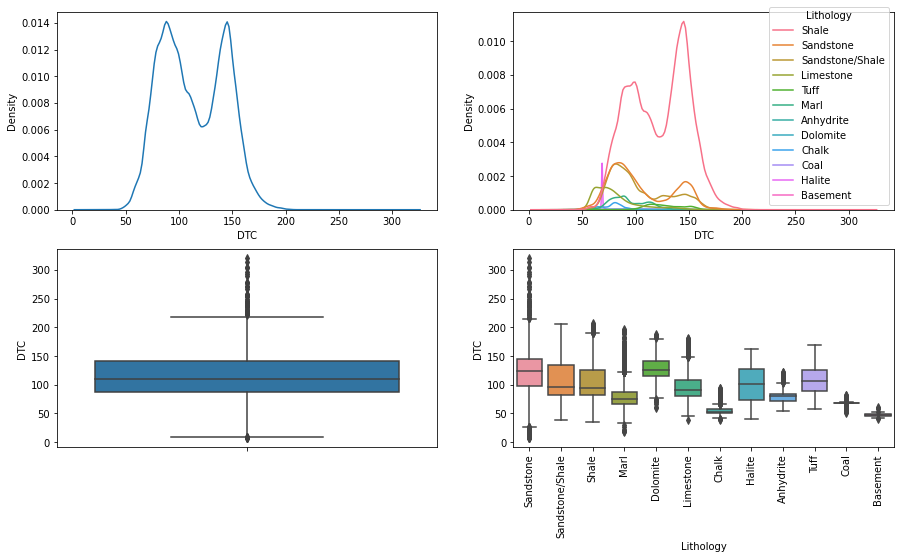

<Figure size 432x288 with 0 Axes>

In [116]:
distribution_plots(data2, Numeric_variables[8], "Lithology")

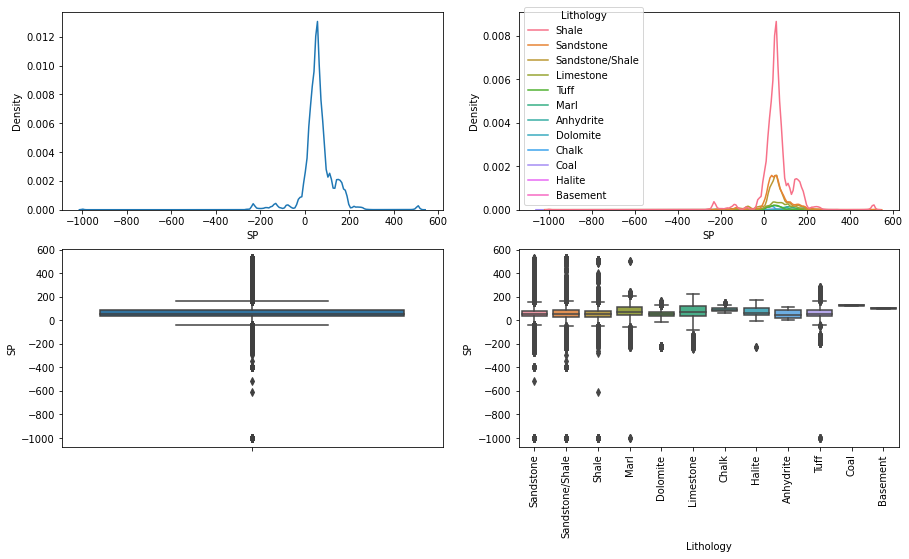

<Figure size 432x288 with 0 Axes>

In [117]:
distribution_plots(data2, Numeric_variables[9], "Lithology")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


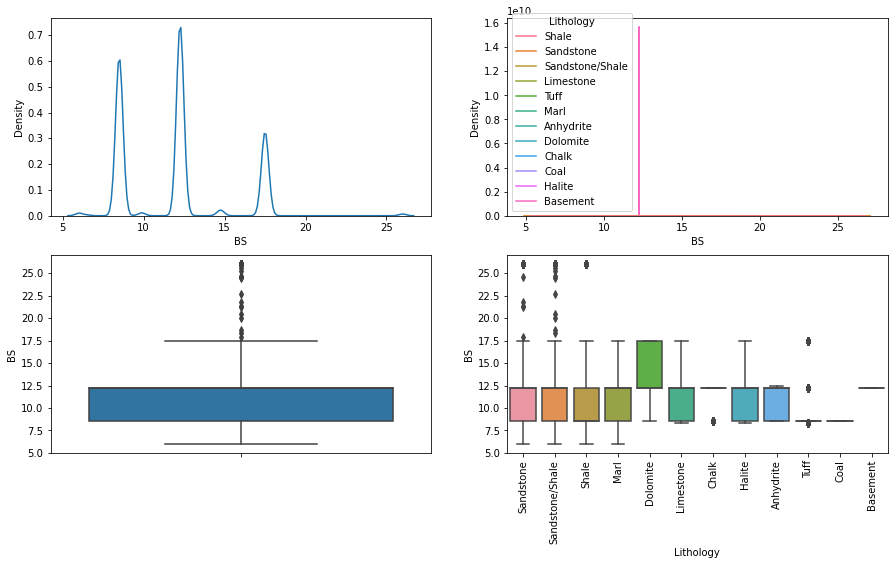

<Figure size 432x288 with 0 Axes>

In [118]:
distribution_plots(data2, Numeric_variables[10], "Lithology")

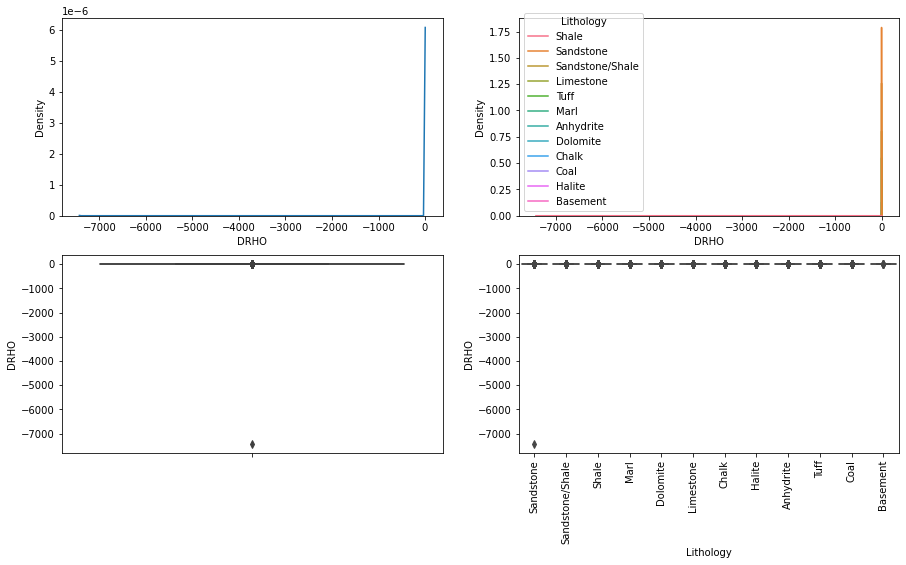

<Figure size 432x288 with 0 Axes>

In [119]:
distribution_plots(data2, Numeric_variables[11], "Lithology")

In [121]:
# Dropping columns with high outliers
data2.drop(["RSHA", "RMED", "RDEP", "PEF", "DRHO"], axis="columns", inplace = True)

The columns dropped have outliers that affect some classes if removed. 

In [138]:
# Removing outliers of GR
data3 = data2[data2["GR"] < outlier_upper_limit(data2["GR"])]

In [139]:
# Removing outliers of NPHI
data3 = data3[(data3["NPHI"] < outlier_upper_limit(data3["NPHI"])) & (data3["NPHI"] > outlier_lower_limit(data3["NPHI"]))]

In [140]:
# Removing outliers of DTC
data3 = data3[(data3["DTC"] < outlier_upper_limit(data3["DTC"])) & (data3["DTC"] > outlier_lower_limit(data3["DTC"]))]

In [141]:
# Removing outliers of SP
data3 = data3[(data3["SP"] < outlier_upper_limit(data3["SP"])) & (data3["SP"] > outlier_lower_limit(data3["SP"]))]

### Encoding categorical variables

In [145]:
# using cat.codes to encode the categorical variables
data3[['WELL','GROUP',"FORMATION", "Lithology"]] = data3[['WELL','GROUP',"FORMATION", "Lithology"]].astype('category')
data3['WELL'] = data3['WELL'].cat.codes
data3['GROUP'] = data3['GROUP'].cat.codes
data3['FORMATION'] = data3['FORMATION'].cat.codes
data3['Lithology'] = data3['Lithology'].cat.codes

In [348]:
# Creating disctionaires that will be used to map the numeric categories to their respective labels
df6 = data2.copy()

df6[['WELL','GROUP',"FORMATION", "Lithology"]] = data2[['WELL','GROUP',"FORMATION", "Lithology"]].astype('category')
WELLS  = dict(enumerate(df6["WELL"].cat.categories))
GROUPS = dict(enumerate(df6["GROUP"].cat.categories))
FORMATIONS  = dict(enumerate(df6["FORMATION"].cat.categories))
Lithologies = dict(enumerate(df6["Lithology"].cat.categories))


### Filling missing values

In [ ]:
# Filling missing values of FORCE_2020_LITHOFACIES_CONFIDENCE with 3
data3.FORCE_2020_LITHOFACIES_CONFIDENCE.fillna(3, inplace = True)

The FORCE_2020_LITHOFACIES_CONFIDENCE is a numeric categorical variable that tells us how confidence we are about the labels of each observation, with 1 as a very confident and 3 as not confident. Filled the missing values with 3, because it is safer to classify those observations as 3 which is the worst case scenario

In [162]:
# Filling the missing values
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute       import IterativeImputer
#from catboost             import CatBoostRegressor

imputer = IterativeImputer(
                            verbose   = 2,
                            max_iter  = 20,
                            imputation_order = 'ascending' )


data4 = pd.DataFrame(imputer.fit_transform(data3), columns = data3.columns) # preserve the column nam

[IterativeImputer] Completing matrix with shape (440587, 17)
[IterativeImputer] Ending imputation round 1/20, elapsed time 10.35
[IterativeImputer] Change: 9.202887747420279, scaled tolerance: 6847.1645 
[IterativeImputer] Early stopping criterion reached.


Used the Iterative imputer to fill the missing values because it useds prediction algoriths to fills the missing values based on the values of the other columns for that observation.

In [164]:
# creating a new columns that contains the litholgy labels
data4["Lithology2"] = data4.FORCE_2020_LITHOFACIES_LITHOLOGY.map(lithology_keys)

In an attempt of fill the missing values, I had encoded all the categorical variables, so I created a new columns for the categorical labels of the lithologies

In [424]:
# Defining a function that conerts keys of a dictionary to values and values to kwys
def values_keys_converter(dict_):
    dict__ = {}
    for k,v in dict_.items():
        dict__[v] = k
    return dict__

WELLS_2int = values_keys_converter(WELLS)
GROUPS_2int = values_keys_converter(GROUPS)
FORMATIONS_2int = values_keys_converter(FORMATIONS)
Litholgies_2int = values_keys_converter(Lithologies)


<a id='eda'></a>
## Exploratory Data Analysis

In [524]:
data4.profile_report(title='Rock Lithology Data Report', progress_bar=False)

### How many observations of each are there?


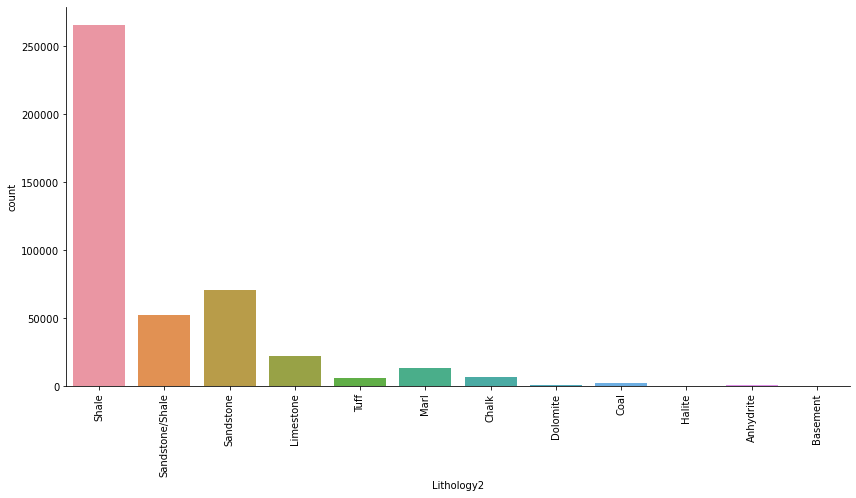

<Figure size 432x288 with 0 Axes>

In [165]:
g = sns.catplot(data = data4, x= "Lithology2", kind = "count", height = 6, aspect = 12/6)
g.set_xticklabels(rotation = 90)
plt.show()
plt.clf()

Shale is the most occured class in then dataset and classes like Basement, halite, Coal, Chalk, dolomite, Anydrite, marl, Tufff and Limetsone are largely underrepresented. Hence,  **The classes are imbalanced**

### Is there a relationship between Groups and Lithologies?

<AxesSubplot:xlabel='GROUP', ylabel='Lithology'>

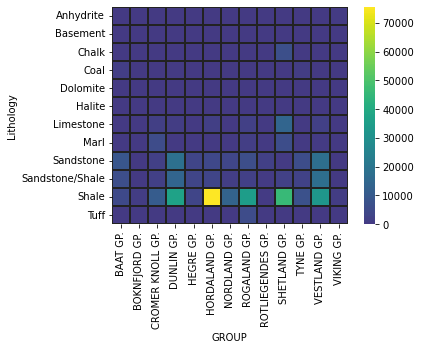

In [483]:
#plt.figure(figsize=(6,12))
sns.heatmap(data = pd.crosstab(data4.Lithology.map(Lithologies), data4.GROUP.map(GROUPS)), 
            cmap="viridis", 
            fmt = "", 
            center = 30000,
            square = True, 
            linewidth = 0.1,
            linecolor = "#222",
            cbar = True)

### Is there a relationship between Formations and Lithologies?

<AxesSubplot:xlabel='FORMATION', ylabel='Lithology'>

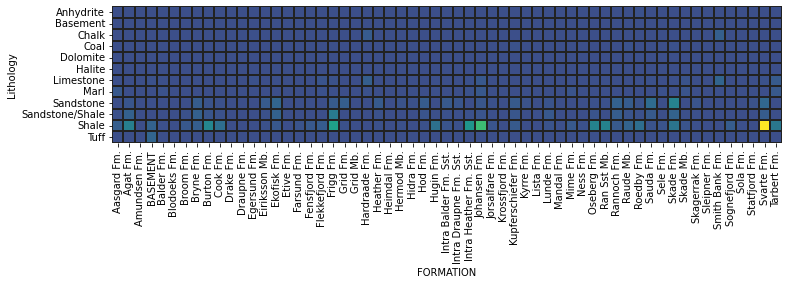

In [485]:
plt.figure(figsize=(12,36))
sns.heatmap(data = pd.crosstab(data4.Lithology.map(Lithologies), data4.FORMATION.map(FORMATIONS)), 
            cmap="viridis", 
            fmt = "", 
            center = 15000,
            square = True, 
            linewidth = 0.1,
            linecolor = "#222",
            cbar = False)

<AxesSubplot:>

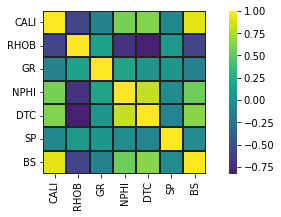

In [454]:
plt.figure(figsize=(8,3))
sns.heatmap(data = data4.iloc[:,7:-4].corr(), 
            cmap="viridis", 
            fmt = "", 
            center = 0,
            square = True, 
            linewidth = 0.1,
            linecolor = "#222")

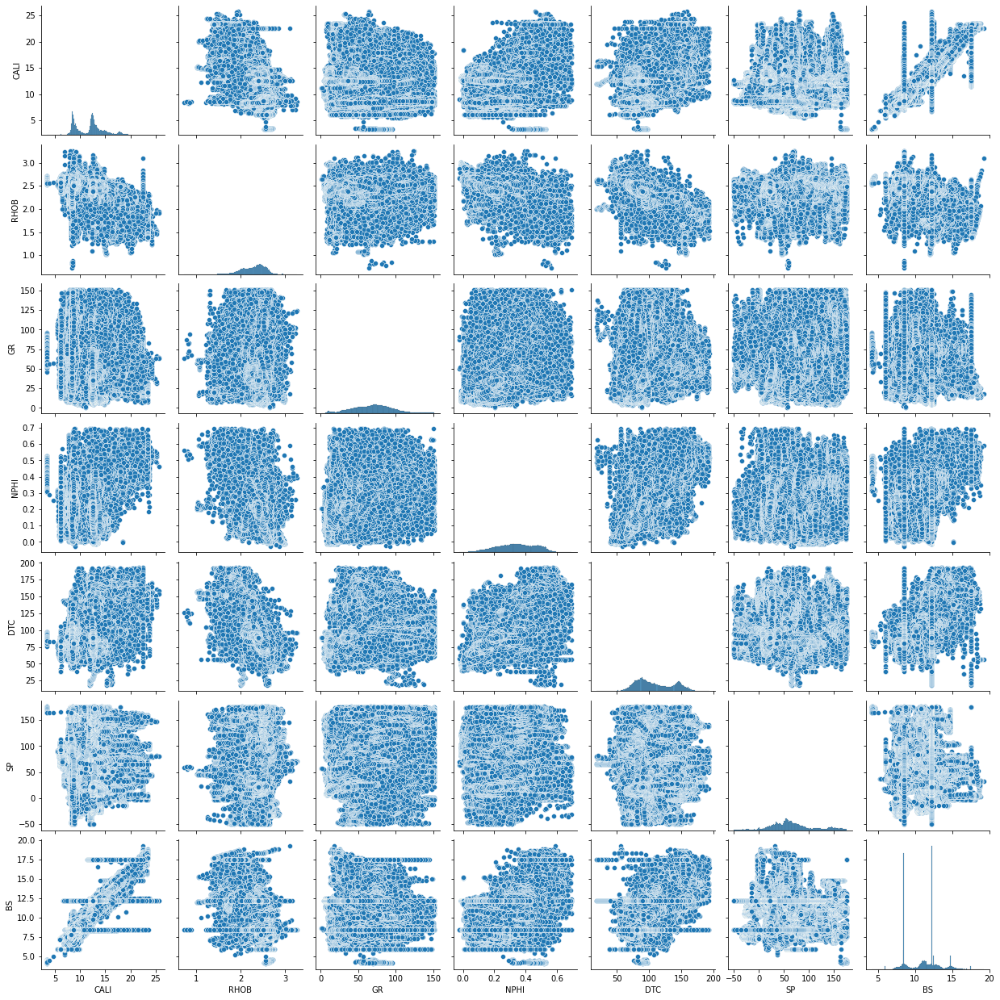

In [173]:
sns.pairplot(data=data4[["CALI", "RHOB", "GR", "NPHI", "DTC", "SP", "BS"]])

In [174]:
data4.head()

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RHOB,GR,NPHI,DTC,SP,BS,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE,Lithology,Lithology2
0,0.0,1139.312,437640.84375,6470976.0,-1114.263428,6.0,57.0,18.033762,1.813854,58.501236,0.639708,144.290085,46.950382,14.867656,65000.0,1.0,10.0,Shale
1,0.0,1139.464,437640.84375,6470976.0,-1114.415405,6.0,57.0,17.976252,1.762011,54.480759,0.588014,150.236420,46.911999,14.814630,65000.0,1.0,10.0,Shale
2,0.0,1139.616,437640.84375,6470976.0,-1114.567383,6.0,57.0,17.999220,1.693400,51.365631,0.563947,156.456635,44.567566,14.775426,65030.0,1.0,9.0,Sandstone/Shale
3,0.0,1139.768,437640.84375,6470976.0,-1114.719360,6.0,57.0,18.015600,1.636616,50.678062,0.582253,162.392105,44.440941,14.703719,65030.0,1.0,9.0,Sandstone/Shale
4,0.0,1139.920,437640.84375,6470976.0,-1114.871338,6.0,57.0,18.441620,1.619630,52.008244,0.603731,163.404480,45.034451,14.907634,65030.0,1.0,9.0,Sandstone/Shale


In [408]:
data4.shape

(440587, 18)

In [176]:
data4.head()

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RHOB,GR,NPHI,DTC,SP,BS,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE,Lithology,Lithology2
0,0.0,1139.312,437640.84375,6470976.0,-1114.263428,6.0,57.0,18.033762,1.813854,58.501236,0.639708,144.290085,46.950382,14.867656,65000.0,1.0,10.0,Shale
1,0.0,1139.464,437640.84375,6470976.0,-1114.415405,6.0,57.0,17.976252,1.762011,54.480759,0.588014,150.236420,46.911999,14.814630,65000.0,1.0,10.0,Shale
2,0.0,1139.616,437640.84375,6470976.0,-1114.567383,6.0,57.0,17.999220,1.693400,51.365631,0.563947,156.456635,44.567566,14.775426,65030.0,1.0,9.0,Sandstone/Shale
3,0.0,1139.768,437640.84375,6470976.0,-1114.719360,6.0,57.0,18.015600,1.636616,50.678062,0.582253,162.392105,44.440941,14.703719,65030.0,1.0,9.0,Sandstone/Shale
4,0.0,1139.920,437640.84375,6470976.0,-1114.871338,6.0,57.0,18.441620,1.619630,52.008244,0.603731,163.404480,45.034451,14.907634,65030.0,1.0,9.0,Sandstone/Shale


### FEATURE SELECTION

In [179]:
Y = data4["Lithology"].values
X = data4.iloc[:,:-4].values

In [180]:
X[:1]

array([[ 0.00000000e+00,  1.13931200e+03,  4.37640844e+05,
         6.47097600e+06, -1.11426343e+03,  6.00000000e+00,
         5.70000000e+01,  1.80337620e+01,  1.81385386e+00,
         5.85012360e+01,  6.39707506e-01,  1.44290085e+02,
         4.69503822e+01,  1.48676564e+01]])

In [181]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    Y, 
                                                    train_size   =  0.6, 
                                                    random_state =  4)
X_test, X_CV, y_test, y_CV = train_test_split( X_test, 
                                               y_test,
                                               test_size = 0.5, 
                                               random_state = 4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:',  X_test.shape,  y_test.shape)
print ('Cross Validation set:', X_CV.shape,  y_CV.shape)

Train set: (264352, 14) (264352,)
Test set: (88117, 14) (88117,)
Cross Validation set: (88118, 14) (88118,)


### Over Sampling the unbalanced classes

In [182]:
from collections import Counter
from imblearn.over_sampling import SMOTE

bm = SMOTE()
#X = data2.iloc[:,1:-2]
#y= data2.iloc[:,-1]
X_res, y_res = bm.fit_resample(X_train, y_train)


<a id='mdd'></a>
## Model Development

In [187]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Normalization
np.set_printoptions(precision=2)

In [291]:
tf.random.set_seed(1234)  

normalizer = Normalization(axis=-1) 
normalizer.adapt(tf.convert_to_tensor(X_train))      

model1 = Sequential(
    [   normalizer,
        Dense(16,  activation  = 'relu',   name = "L1"),
        Dense(64, activation  = 'relu',   name = "L2"),
        Dense(32, activation  = 'relu',   name = "L3"),
        Dense(16, activation  = 'relu',   name = "L4"),
        Dense(12,  activation  = 'softmax',name = "CC")
    ]
                    )

In [292]:
model1.compile (
    loss     = tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer= tf.keras.optimizers.Adam(),
                )



In [293]:
from keras import callbacks
earlystopping = callbacks.EarlyStopping(monitor ="loss",
                                        mode ="min", patience = 5,
                                        restore_best_weights = True)

model1.fit(X_train, y_train, batch_size = 128,
                    epochs = 100,
                    callbacks =[earlystopping])


Epoch 1/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.7141
Epoch 2/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.5342
Epoch 3/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4885
Epoch 4/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4628
Epoch 5/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4455
Epoch 6/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4331
Epoch 7/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4235
Epoch 8/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4159
Epoch 9/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4088
Epoch 10/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.4025
Epoch 11/100
2066/2066 [==============================] - 5s 2ms/step - loss: 0.3969
Epoch 12/100
2066/2066 [==============================] - 5s 2ms/step - lo

In [294]:
model1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_2 (Normalizat  (None, 14)               29        
 ion)                                                            
                                                                 
 L1 (Dense)                  (None, 16)                240       
                                                                 
 L2 (Dense)                  (None, 64)                1088      
                                                                 
 L3 (Dense)                  (None, 32)                2080      
                                                                 
 L4 (Dense)                  (None, 16)                528       
                                                                 
 CC (Dense)                  (None, 12)                204       
                                                      

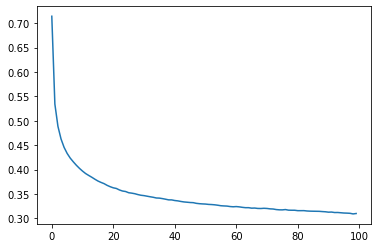

In [295]:
plt.plot(model1.history.history["loss"])

In [299]:
tf.random.set_seed(1234)  

normalizer = Normalization(axis=-1) 
normalizer.adapt(tf.convert_to_tensor(X_train))      

model2 = Sequential(
    [   normalizer,
        Dense(64,  activation  = 'relu',   name = "L1"),
        Dense(64, activation  = 'relu',   name = "L2"),
        Dense(32, activation  = 'relu',   name = "L3"),
        Dense(16, activation  = 'relu',   name = "L4"),
        Dense(12,  activation  = 'softmax',name = "CC")
    ]
                    )

In [300]:
model2.compile (
    loss     = tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer= tf.keras.optimizers.Adam(),
                )


In [301]:
earlystopping = callbacks.EarlyStopping(monitor ="loss",
                                        mode ="min", patience = 5,
                                        restore_best_weights = True)

model2.fit(X_train, y_train,
                    epochs = 100,
                    callbacks =[earlystopping])

Epoch 1/100
8261/8261 [==============================] - 17s 2ms/step - loss: 0.5375
Epoch 2/100
8261/8261 [==============================] - 18s 2ms/step - loss: 0.4147
Epoch 3/100
8261/8261 [==============================] - 18s 2ms/step - loss: 0.3810
Epoch 4/100
8261/8261 [==============================] - 17s 2ms/step - loss: 0.3623
Epoch 5/100
8261/8261 [==============================] - 17s 2ms/step - loss: 0.3487
Epoch 6/100
8261/8261 [==============================] - 19s 2ms/step - loss: 0.3379
Epoch 7/100
8261/8261 [==============================] - 16s 2ms/step - loss: 0.3287
Epoch 8/100
8261/8261 [==============================] - 16s 2ms/step - loss: 0.3210
Epoch 9/100
8261/8261 [==============================] - 16s 2ms/step - loss: 0.3142
Epoch 10/100
8261/8261 [==============================] - 16s 2ms/step - loss: 0.3076
Epoch 11/100
8261/8261 [==============================] - 17s 2ms/step - loss: 0.3027
Epoch 12/100
8261/8261 [==============================] - 16s 2

In [302]:
model2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_3 (Normalizat  (None, 14)               29        
 ion)                                                            
                                                                 
 L1 (Dense)                  (None, 64)                960       
                                                                 
 L2 (Dense)                  (None, 64)                4160      
                                                                 
 L3 (Dense)                  (None, 32)                2080      
                                                                 
 L4 (Dense)                  (None, 16)                528       
                                                                 
 CC (Dense)                  (None, 12)                204       
                                                      

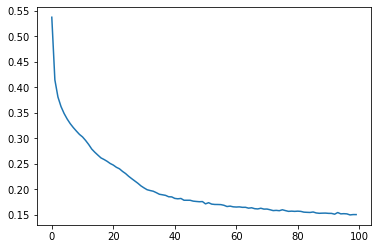

In [303]:
plt.plot(model2.history.history["loss"])

In [319]:
tf.random.set_seed(1234)  

normalizer = Normalization(axis=-1) 
normalizer.adapt(tf.convert_to_tensor(X_train))      

model3 = Sequential(
    [   normalizer,
        Dense(128,  activation  = 'relu',   name = "L1"),
        Dense(64, activation  = 'relu',   name = "L2"),
        Dense(32, activation  = 'relu',   name = "L3"),
        Dense(16, activation  = 'relu',   name = "L4"),
        Dense(12,  activation  = 'softmax',name = "CC")
    ]
                    )

In [320]:
model3.compile (
    loss     = tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer= tf.keras.optimizers.Adam(),
                )


In [321]:
earlystopping = callbacks.EarlyStopping(monitor ="loss",
                                        mode ="min", patience = 5,
                                        restore_best_weights = True)

model3.fit(X_train, y_train,
                    epochs = 200,
                    callbacks =[earlystopping])

Epoch 1/200
8261/8261 [==============================] - 19s 2ms/step - loss: 0.5301
Epoch 2/200
8261/8261 [==============================] - 17s 2ms/step - loss: 0.4072
Epoch 3/200
8261/8261 [==============================] - 17s 2ms/step - loss: 0.3731
Epoch 4/200
8261/8261 [==============================] - 17s 2ms/step - loss: 0.3526
Epoch 5/200
8261/8261 [==============================] - 18s 2ms/step - loss: 0.3384
Epoch 6/200
8261/8261 [==============================] - 18s 2ms/step - loss: 0.3266
Epoch 7/200
8261/8261 [==============================] - 18s 2ms/step - loss: 0.3170
Epoch 8/200
8261/8261 [==============================] - 18s 2ms/step - loss: 0.3084
Epoch 9/200
8261/8261 [==============================] - 18s 2ms/step - loss: 0.3012
Epoch 10/200
8261/8261 [==============================] - 21s 3ms/step - loss: 0.2950
Epoch 11/200
8261/8261 [==============================] - 18s 2ms/step - loss: 0.2906
Epoch 12/200
8261/8261 [==============================] - 19s 2

In [322]:
model3.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_5 (Normalizat  (None, 14)               29        
 ion)                                                            
                                                                 
 L1 (Dense)                  (None, 128)               1920      
                                                                 
 L2 (Dense)                  (None, 64)                8256      
                                                                 
 L3 (Dense)                  (None, 32)                2080      
                                                                 
 L4 (Dense)                  (None, 16)                528       
                                                                 
 CC (Dense)                  (None, 12)                204       
                                                      

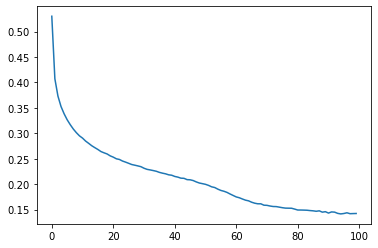

In [323]:
plt.plot(model3.history.history["loss"])

### <a id='mde'></a>
## Model Evaluation

In [445]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, jaccard_score, f1_score
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,
                fmt="d", 
                center=0, 
                cmap='viridis',  
                square = True, 
                linewidth = 0.1, 
                linecolor = "#222") 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [282]:
def nnmodel_predict(Model, X_train):
    prediction = Model.predict(X_train)
    prediction_p = tf.nn.softmax(prediction)
    yhat = np.argmax(prediction, axis=1)
    return yhat

In [502]:
def accuracy_metrics(y_train, yhat):
    print(f" the accuarcy of the model is {accuracy_score(y_train, yhat)} \n")
    print(f" the F1 score of the mdel is {f1_score(y_train, yhat, average='weighted')} \n") 
    print(f" the jaccard score of the model is {jaccard_score(y_train, yhat, average='weighted')}\n")
    cm = confusion_matrix(y_train,yhat)
    draw_confusion_matrix(cm)
    print(classification_report(y_train, yhat))

In [284]:
A = np.load('penalty_matrix.npy')

def score(y_true, y_pred):
    S = 0.0
    y_true = y_true.astype(int)
    y_pred = y_pred.astype(int)
    for i in range(0, y_true.shape[0]):
        S -= A[y_true[i], y_pred[i]]
    return S/y_true.shape[0]


### Train set

In [496]:
yhat_train = nnmodel_predict(model3, X_train)


8261/8261 [==============================] - 13s 2ms/step


In [497]:
score(y_train, yhat_train)

-0.1622992260319574

 the accuarcy of the model is 0.9527296937416777 

 the F1 score of the mdel is 0.9523045687811286 

 the jaccard score of the model is 0.9111376170524613



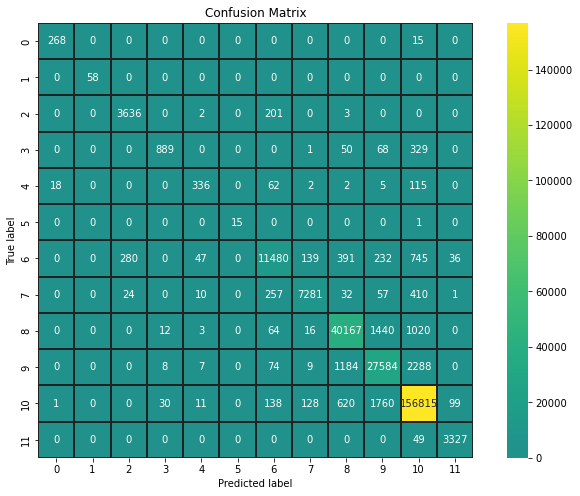

              precision    recall  f1-score   support

         0.0       0.93      0.95      0.94       283
         1.0       1.00      1.00      1.00        58
         2.0       0.92      0.95      0.93      3842
         3.0       0.95      0.66      0.78      1337
         4.0       0.81      0.62      0.70       540
         5.0       1.00      0.94      0.97        16
         6.0       0.94      0.86      0.90     13350
         7.0       0.96      0.90      0.93      8072
         8.0       0.95      0.94      0.94     42722
         9.0       0.89      0.89      0.89     31154
        10.0       0.97      0.98      0.98    159602
        11.0       0.96      0.99      0.97      3376

    accuracy                           0.95    264352
   macro avg       0.94      0.89      0.91    264352
weighted avg       0.95      0.95      0.95    264352



In [503]:
accuracy_metrics(y_train, yhat_train)

### Cross validation set

In [490]:
yhat_CV = nnmodel_predict(model3, X_CV)


2754/2754 [==============================] - 4s 1ms/step


In [491]:
score(y_CV, yhat_CV)

-0.19322385891645294

 the accuarcy of the model is 0.9437912798747135 

 the F1 score of the mdel is 0.9432030395133406 

 the jaccard score of the model is 0.8955289776064852



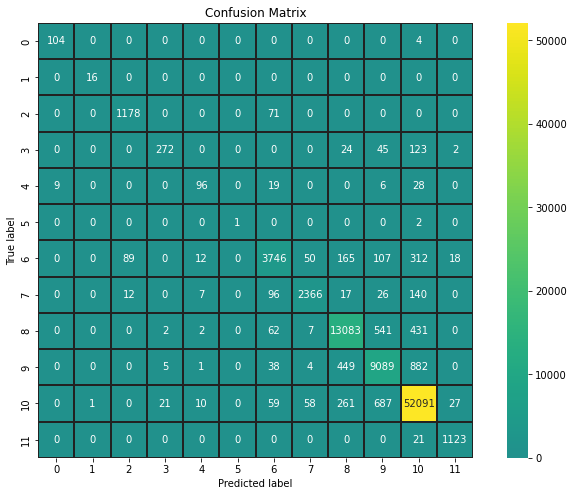

              precision    recall  f1-score   support

         0.0       0.92      0.96      0.94       108
         1.0       0.94      1.00      0.97        16
         2.0       0.92      0.94      0.93      1249
         3.0       0.91      0.58      0.71       466
         4.0       0.75      0.61      0.67       158
         5.0       1.00      0.33      0.50         3
         6.0       0.92      0.83      0.87      4499
         7.0       0.95      0.89      0.92      2664
         8.0       0.93      0.93      0.93     14128
         9.0       0.87      0.87      0.87     10468
        10.0       0.96      0.98      0.97     53215
        11.0       0.96      0.98      0.97      1144

    accuracy                           0.94     88118
   macro avg       0.92      0.83      0.85     88118
weighted avg       0.94      0.94      0.94     88118



In [504]:
accuracy_metrics(y_CV, yhat_CV)

### Test set

In [499]:
yhat_test = nnmodel_predict(model3, X_test)

2754/2754 [==============================] - 4s 2ms/step


In [500]:
score(y_test, yhat_test)

-0.19124714867732673

 the accuarcy of the model is 0.944233235357536 

 the F1 score of the mdel is 0.9436091187309384 

 the jaccard score of the model is 0.8961857773685947



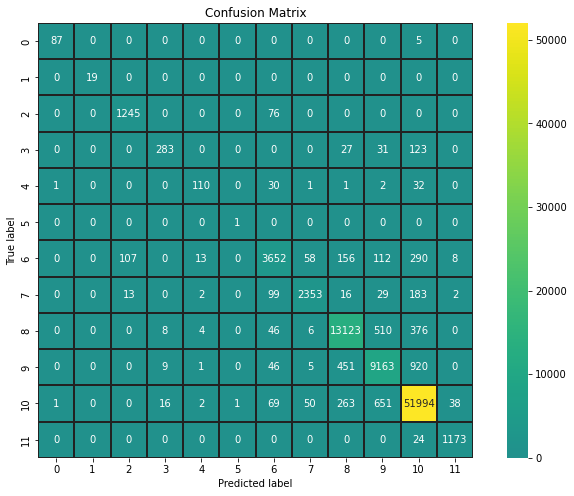

              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96        92
         1.0       1.00      1.00      1.00        19
         2.0       0.91      0.94      0.93      1321
         3.0       0.90      0.61      0.73       464
         4.0       0.83      0.62      0.71       177
         5.0       0.50      1.00      0.67         1
         6.0       0.91      0.83      0.87      4396
         7.0       0.95      0.87      0.91      2697
         8.0       0.93      0.93      0.93     14073
         9.0       0.87      0.86      0.87     10595
        10.0       0.96      0.98      0.97     53085
        11.0       0.96      0.98      0.97      1197

    accuracy                           0.94     88117
   macro avg       0.89      0.88      0.88     88117
weighted avg       0.94      0.94      0.94     88117



In [505]:
accuracy_metrics(y_test, yhat_test)

### Model Pipeline

In [409]:

def wrangling(df):
    df.dropna(subset = ["X_LOC"], inplace = True)
    df.drop(columns_high_nulls, axis = "columns", inplace = True)
    data2 = df.copy()
    data2["Lithology"] = data2.FORCE_2020_LITHOFACIES_LITHOLOGY.map(lithology_keys)
    data2.drop(["RSHA", "RMED", "RDEP", "PEF", "DRHO"], axis="columns", inplace = True)
    data3 = data2[data2["GR"] < outlier_upper_limit(data2["GR"])]
    data3 = data3[(data3["NPHI"] < outlier_upper_limit(data3["NPHI"])) & (data3["NPHI"] > outlier_lower_limit(data3["NPHI"]))]
    data3 = data3[(data3["DTC"] < outlier_upper_limit(data3["DTC"])) & (data3["DTC"] > outlier_lower_limit(data3["DTC"]))]
    data3 = data3[(data3["SP"] < outlier_upper_limit(data3["SP"])) & (data3["SP"] > outlier_lower_limit(data3["SP"]))]

    #data3[['WELL','GROUP',"FORMATION", "Lithology"]] = data3[['WELL','GROUP',"FORMATION", "Lithology"]].astype('category')
    data3['WELL'] = data3['WELL'].map(WELLS_2int)
    data3['GROUP'] = data3['GROUP'].map(GROUPS_2int)
    data3['FORMATION'] = data3['FORMATION'].map(FORMATIONS_2int)
    data3['Lithology'] = data3['Lithology'].map(Litholgies_2int)

    data3.FORCE_2020_LITHOFACIES_CONFIDENCE.fillna(3, inplace = True)
    data4 = pd.DataFrame(imputer.fit_transform(data3), columns = data3.columns) # preserve the column nam
    data4["Lithology2"] = data4.FORCE_2020_LITHOFACIES_LITHOLOGY.map(lithology_keys)
    return data4

In [398]:
def preprocessing(df):
    data = wrangling(df)
    Y = data["Lithology"].values
    X = data.iloc[:,:-4].values
    return X, Y

In [410]:
test = pd.read_csv("train.csv",delimiter = ';')

In [411]:
X_final, Y_final = preprocessing(test)

[IterativeImputer] Completing matrix with shape (440587, 17)
[IterativeImputer] Ending imputation round 1/20, elapsed time 10.37
[IterativeImputer] Change: 40.90326873925436, scaled tolerance: 6847.1645 
[IterativeImputer] Early stopping criterion reached.


In [413]:
X_final.shape

(440587, 14)

In [506]:
y_hatfinal = nnmodel_predict(model3,X_final)

13769/13769 [==============================] - 21s 2ms/step


 the accuarcy of the model is 0.7723900160467739 

 the F1 score of the mdel is 0.7538757565744824 

 the jaccard score of the model is 0.6387128714681931



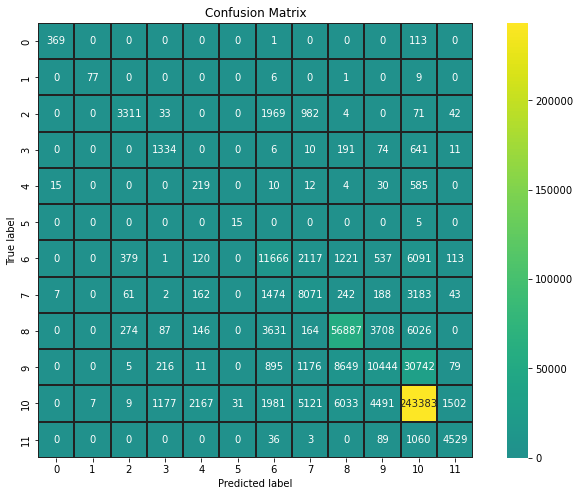

              precision    recall  f1-score   support

         0.0       0.94      0.76      0.84       483
         1.0       0.92      0.83      0.87        93
         2.0       0.82      0.52      0.63      6412
         3.0       0.47      0.59      0.52      2267
         4.0       0.08      0.25      0.12       875
         5.0       0.33      0.75      0.45        20
         6.0       0.54      0.52      0.53     22245
         7.0       0.46      0.60      0.52     13433
         8.0       0.78      0.80      0.79     70923
         9.0       0.53      0.20      0.29     52217
        10.0       0.83      0.92      0.87    265902
        11.0       0.72      0.79      0.75      5717

    accuracy                           0.77    440587
   macro avg       0.62      0.63      0.60    440587
weighted avg       0.76      0.77      0.75    440587



In [507]:
accuracy_metrics(Y_final, y_hatfinal)

### Saving Model

In [508]:
model3.save("PredictingRockLithologyModelANNFinal")

INFO:tensorflow:Assets written to: PredictingRockLithologyModelANNFinal\assets


### USING RANDOM FOREST CLASSIFIER

In [509]:
rf_model = RandomForestClassifier(n_estimators=50, random_state=42, class_weight='balanced_subsample')

In [510]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', n_estimators=50,
                       random_state=42)

In [511]:
y_pred_train = rf_model.predict(X_train)

 the accuarcy of the model is 0.999943257474882 

 the F1 score of the mdel is 0.9999432552680636 

 the jaccard score of the model is 0.9998865243784725



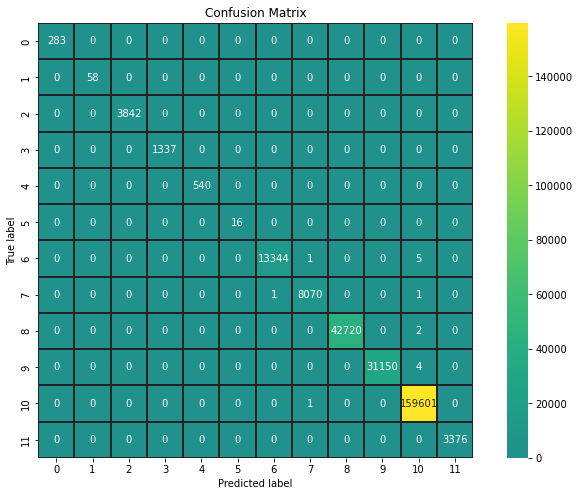

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       283
         1.0       1.00      1.00      1.00        58
         2.0       1.00      1.00      1.00      3842
         3.0       1.00      1.00      1.00      1337
         4.0       1.00      1.00      1.00       540
         5.0       1.00      1.00      1.00        16
         6.0       1.00      1.00      1.00     13350
         7.0       1.00      1.00      1.00      8072
         8.0       1.00      1.00      1.00     42722
         9.0       1.00      1.00      1.00     31154
        10.0       1.00      1.00      1.00    159602
        11.0       1.00      1.00      1.00      3376

    accuracy                           1.00    264352
   macro avg       1.00      1.00      1.00    264352
weighted avg       1.00      1.00      1.00    264352



In [512]:
accuracy_metrics(y_train, y_pred_train)

In [513]:
y_pred_test = rf_model.predict(X_test)

 the accuarcy of the model is 0.9555023434751524 

 the F1 score of the mdel is 0.9549593657323087 

 the jaccard score of the model is 0.9154294677508005



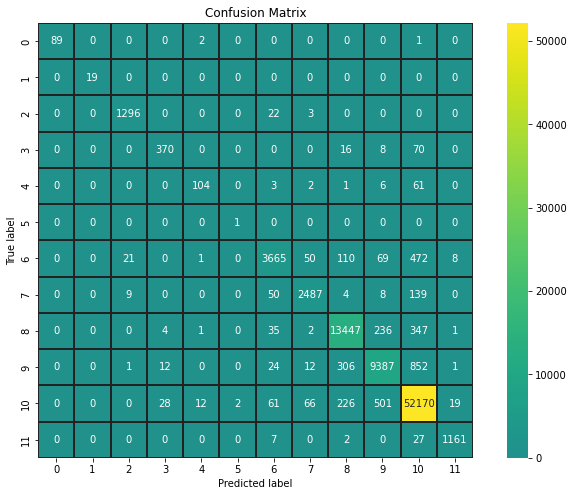

              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98        92
         1.0       1.00      1.00      1.00        19
         2.0       0.98      0.98      0.98      1321
         3.0       0.89      0.80      0.84       464
         4.0       0.87      0.59      0.70       177
         5.0       0.33      1.00      0.50         1
         6.0       0.95      0.83      0.89      4396
         7.0       0.95      0.92      0.94      2697
         8.0       0.95      0.96      0.95     14073
         9.0       0.92      0.89      0.90     10595
        10.0       0.96      0.98      0.97     53085
        11.0       0.98      0.97      0.97      1197

    accuracy                           0.96     88117
   macro avg       0.90      0.91      0.89     88117
weighted avg       0.96      0.96      0.95     88117



In [514]:
accuracy_metrics(y_test, y_pred_test)

In [515]:
y_pred_test_2 = rf_model.predict(X_CV)

 the accuarcy of the model is 0.9538800245125854 

 the F1 score of the mdel is 0.9532550349308679 

 the jaccard score of the model is 0.9125142117255439



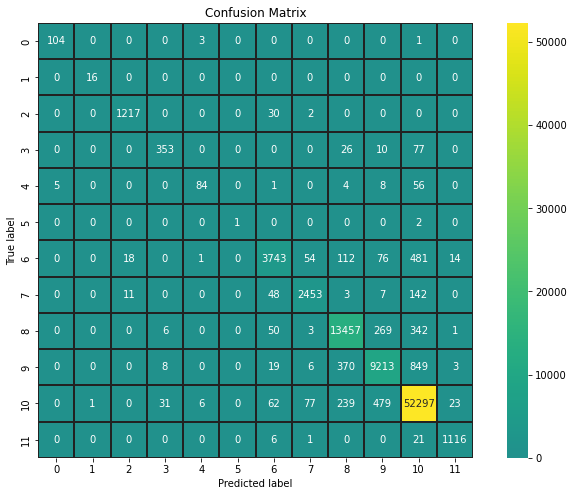

              precision    recall  f1-score   support

         0.0       0.95      0.96      0.96       108
         1.0       0.94      1.00      0.97        16
         2.0       0.98      0.97      0.98      1249
         3.0       0.89      0.76      0.82       466
         4.0       0.89      0.53      0.67       158
         5.0       1.00      0.33      0.50         3
         6.0       0.95      0.83      0.89      4499
         7.0       0.94      0.92      0.93      2664
         8.0       0.95      0.95      0.95     14128
         9.0       0.92      0.88      0.90     10468
        10.0       0.96      0.98      0.97     53215
        11.0       0.96      0.98      0.97      1144

    accuracy                           0.95     88118
   macro avg       0.94      0.84      0.87     88118
weighted avg       0.95      0.95      0.95     88118



In [516]:
accuracy_metrics(y_CV, y_pred_test_2)

In [518]:
y_pred_Final = rf_model.predict(X_final)

 the accuarcy of the model is 0.9312893934682593 

 the F1 score of the mdel is 0.9267128740117272 

 the jaccard score of the model is 0.8697023877293181



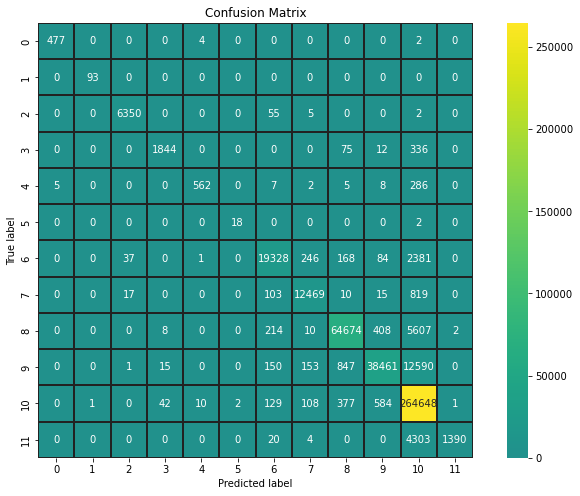

              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       483
         1.0       0.99      1.00      0.99        93
         2.0       0.99      0.99      0.99      6412
         3.0       0.97      0.81      0.88      2267
         4.0       0.97      0.64      0.77       875
         5.0       0.90      0.90      0.90        20
         6.0       0.97      0.87      0.91     22245
         7.0       0.96      0.93      0.94     13433
         8.0       0.98      0.91      0.94     70923
         9.0       0.97      0.74      0.84     52217
        10.0       0.91      1.00      0.95    265902
        11.0       1.00      0.24      0.39      5717

    accuracy                           0.93    440587
   macro avg       0.97      0.83      0.88    440587
weighted avg       0.94      0.93      0.93    440587



In [519]:
accuracy_metrics(Y_final, y_pred_Final)

<a id='conclusions'></a>
## Conclusions

> **Tip**: Finally, summarize your findings and the results that have been performed. Make sure that you are clear with regards to the limitations of your exploration. If you haven't done any statistical tests, do not imply any statistical conclusions. And make sure you avoid implying causation from correlation!

> **Tip**: Once you are satisfied with your work, you should save a copy of the report in HTML or PDF form via the **File** > **Download as** submenu. Before exporting your report, check over it to make sure that the flow of the report is complete. You should probably remove all of the "Tip" quotes like this one so that the presentation is as tidy as possible. Congratulations!

In [ ]:
wells = data2['WELL'].unique()

In [ ]:
well_data = data2[data2['WELL'] == wells[32]]
fig, axs = plt.subplots(1, len(well_data.columns)-9, figsize=(14, 10), sharey=True)
for ic, col in enumerate(set(well_data.columns)-set(['DEPTH_MD', 'FORCE_2020_LITHOFACIES_LITHOLOGY',
                                                     'FORCE_2020_LITHOFACIES_CONFIDENCE', 'WELL', 'GROUP', 'FORMATION',
                                                    'X_LOC', 'Y_LOC', 'Z_LOC'])):
    axs[ic].plot(well_data[col], well_data['DEPTH_MD'])
    axs[ic].set_xlabel(col)
axs[0].set_ylim(well_data['DEPTH_MD'].values[-1], well_data['DEPTH_MD'].values[0])

In [ ]:
sns.catplot(data = data2, x= "FORCE_2020_LITHOFACIES_LITHOLOGY",hue = "FORMATION", kind = "count", height = 6, aspect = 12/6)